<a href="https://colab.research.google.com/github/bindushreerd85-sketch/Q1_Q2_ImageSegmentation/blob/main/q2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install transformers for CLIPSeg
!pip install -q transformers

# Install Segment Anything if not already installed
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

# For video processing (if doing bonus)
!pip install -q opencv-python

  Preparing metadata (setup.py) ... done


In [ ]:
import torch
import numpy as np
from PIL import Image
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from segment_anything import sam_model_registry, SamPredictor
from google.colab import files
import cv2
from IPython.display import display

Saving pexels-catscoming-1543793.jpg to pexels-catscoming-1543793.jpg


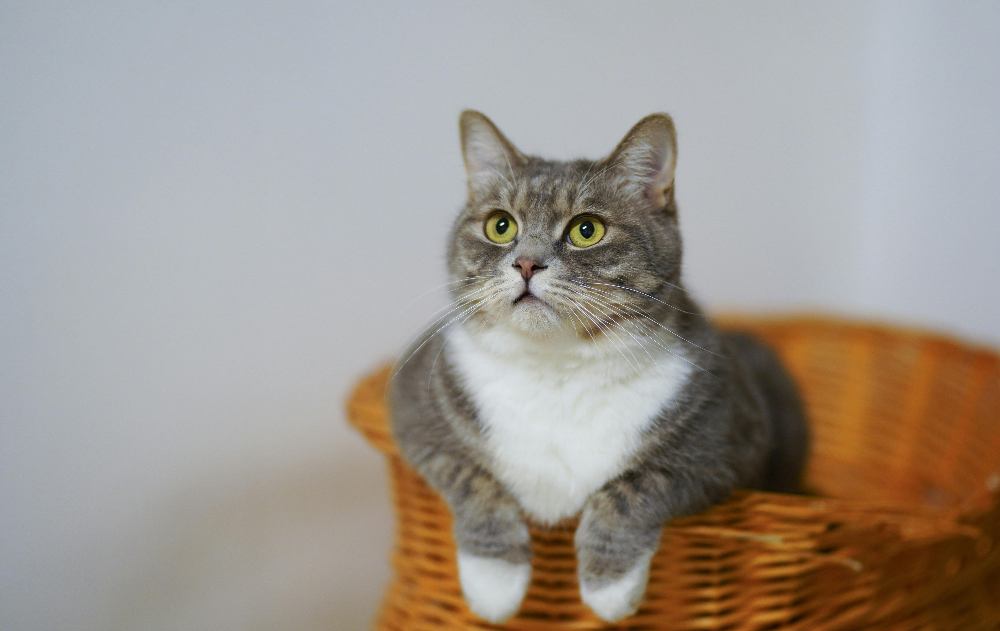

In [ ]:
# Upload image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]

# Open image with PIL
image = Image.open(image_path)
display(image)

In [ ]:
# Load CLIPSeg
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
clipseg_model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined")
clipseg_model.to("cuda")  # move to GPU

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/974 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/603M [00:00<?, ?B/s]

CLIPSegForImageSegmentation(
  (clip): CLIPSegModel(
    (text_model): CLIPSegTextTransformer(
      (embeddings): CLIPSegTextEmbeddings(
        (token_embedding): Embedding(49408, 512)
        (position_embedding): Embedding(77, 512)
      )
      (encoder): CLIPSegEncoder(
        (layers): ModuleList(
          (0-11): 12 x CLIPSegEncoderLayer(
            (self_attn): CLIPSegAttention(
              (k_proj): Linear(in_features=512, out_features=512, bias=True)
              (v_proj): Linear(in_features=512, out_features=512, bias=True)
              (q_proj): Linear(in_features=512, out_features=512, bias=True)
              (out_proj): Linear(in_features=512, out_features=512, bias=True)
            )
            (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
            (mlp): CLIPSegMLP(
              (activation_fn): QuickGELUActivation()
              (fc1): Linear(in_features=512, out_features=2048, bias=True)
              (fc2): Linear(in_features=20

In [ ]:
# Assuming SAM ViT-L is already installed
sam_checkpoint = "/content/drive/MyDrive/sam_vit_l_0b3195.pth"  # change path if needed
sam_type = "vit_l"

sam_model = sam_model_registry[sam_type](checkpoint=sam_checkpoint)
sam_model.to("cuda")
predictor = SamPredictor(sam_model)

In [ ]:
!wget -O /content/sam_vit_l.pth https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth

--2025-10-04 07:54:37--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 18.154.144.102, 18.154.144.74, 18.154.144.87, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|18.154.144.102|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1249524607 (1.2G) [binary/octet-stream]
Saving to: ‘/content/sam_vit_l.pth’

/content/sam_vit_l. 100%[===================>]   1.16G   192MB/s    in 14s     

2025-10-04 07:54:51 (85.1 MB/s) - ‘/content/sam_vit_l.pth’ saved [1249524607/1249524607]



Using device: cuda
Refined mask saved to: /content/mask/mask_refined.png


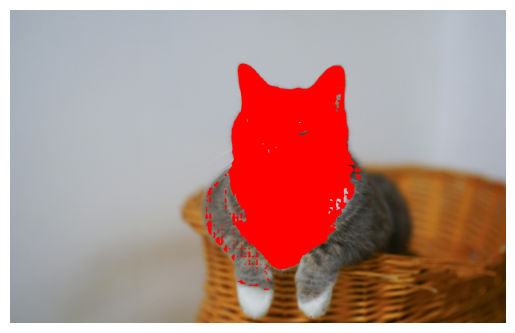

In [ ]:
#Imports
import torch
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from transformers import CLIPSegProcessor, CLIPSegForImageSegmentation
from segment_anything import sam_model_registry, SamPredictor
import cv2
import os

# Device
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

# Load image
image_path = "/content/pexels-catscoming-1543793.jpg"
image = Image.open(image_path).convert("RGB")
image_np = np.array(image)
H, W = image_np.shape[:2]

# Text prompt
text_prompt = "cat face"

# Load CLIPSeg
processor = CLIPSegProcessor.from_pretrained("CIDAS/clipseg-rd64-refined")
clipseg_model = CLIPSegForImageSegmentation.from_pretrained("CIDAS/clipseg-rd64-refined").to(device)

# Run CLIPSeg
inputs = processor(images=image, text=text_prompt, return_tensors="pt")
inputs = {k: v.to(device) for k, v in inputs.items()}
with torch.no_grad():
    output = clipseg_model(**inputs)

# Convert to binary mask
logits_np = torch.sigmoid(output.logits).cpu().numpy()
clipseg_mask = logits_np[0,0,:,:] if logits_np.ndim==4 else logits_np[0,:,:]

# Upsample to original image size
clipseg_mask = cv2.resize(clipseg_mask, (W, H))
clipseg_mask_bin = (clipseg_mask > 0.5).astype(np.uint8)

# Optional: dilate mask to cover edges
kernel = np.ones((5,5), np.uint8)
clipseg_mask_bin = cv2.dilate(clipseg_mask_bin, kernel, iterations=1)

# Save rough mask
os.makedirs("/content/mask", exist_ok=True)
Image.fromarray((clipseg_mask_bin*255).astype(np.uint8)).save("/content/mask/clipseg_mask.png")

# Load SAM
sam_checkpoint = "/content/sam_vit_l.pth"
sam = sam_model_registry["vit_l"](checkpoint=sam_checkpoint).to(device)
predictor = SamPredictor(sam)
predictor.set_image(image_np)

# Bounding box + points
ys, xs = np.where(clipseg_mask_bin == 1)
if len(xs) == 0:
    raise ValueError("No foreground pixels found in CLIPSeg mask!")

x_min, x_max = xs.min(), xs.max()
y_min, y_max = ys.min(), ys.max()
box = np.array([x_min, y_min, x_max, y_max])

num_points = min(200, len(xs))
idxs = np.random.choice(len(xs), num_points, replace=False)
points = np.stack([xs[idxs], ys[idxs]], axis=-1)
point_labels = np.ones(len(points))

# Run SAM
masks, scores, logits = predictor.predict(
    point_coords=points,
    point_labels=point_labels,
    box=box[None, :],
    multimask_output=False
)
refined_mask = masks[0]

# Save refined mask
mask_img = Image.fromarray((refined_mask*255).astype(np.uint8))
mask_path = "/content/mask/mask_refined.png"
mask_img.save(mask_path)
print("Refined mask saved to:", mask_path)

#  Overlay
overlay = image_np.copy()
overlay[refined_mask.astype(bool)] = [255, 0, 0]
plt.imshow(overlay)
plt.axis("off")
plt.show()

In [ ]:
import cv2
import numpy as np
from PIL import Image
import os
from tqdm import tqdm

# Paths
image_path = "/content/pexels-catscoming-1543793.jpg"       # original image
mask_path = "/content/mask/mask_refined.png"               # refined mask from SAM
output_folder = "/content/drive/MyDrive/video"
os.makedirs(output_folder, exist_ok=True)
output_video_path = os.path.join(output_folder, "cat_face_mask_video.mp4")

# Load image and mask
image = np.array(Image.open(image_path).convert("RGB"))
mask = np.array(Image.open(mask_path).convert("L")) / 255.0  # normalize [0,1]
H, W = image.shape[:2]

# Video parameters
fps = 10
duration = 15  # seconds, can be 10–30
num_frames = fps * duration
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (W, H))

# Simulate mask propagation across frames
for i in tqdm(range(num_frames)):
    # Optional: small simulated motion
    dx = int(5 * np.sin(2 * np.pi * i / num_frames))
    dy = int(3 * np.cos(2 * np.pi * i / num_frames))
    M = np.float32([[1, 0, dx], [0, 1, dy]])

    # Apply affine transform
    frame = cv2.warpAffine(image, M, (W, H))
    mask_moved = cv2.warpAffine((mask*255).astype(np.uint8), M, (W, H))

    # Overlay mask (red highlight)
    overlay = frame.copy()
    overlay[mask_moved > 128] = [255, 0, 0]  # red for masked region

    # Write frame to video
    out.write(cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

out.release()
print("Video with mask propagation saved to:", output_video_path)


100%|██████████| 150/150 [01:31<00:00,  1.63it/s]

Video with mask propagation saved to: /content/drive/MyDrive/video/cat_face_mask_video.mp4
